## Diabetes Analysis and Prediction using Smote

### Import Library

In [104]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as po
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import matplotlib.pyplot as plt
import seaborn as sns
import dash
import plotly.express as px
import random
import plotly.figure_factory as ff
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_rows",None)
from sklearn import preprocessing 
%matplotlib inline

In [105]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.combine import SMOTEENN #resampling
from sklearn import datasets, linear_model, metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

### Import data from file .csv

In [89]:
df = pd.read_csv('diabetes_binary_health_indicators_BRFSS2015.csv')
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


In [90]:
df.shape

(253680, 22)

### <i> Terdiri dari 22 Kolom dan 253,680 baris

In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_binary       253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

### <i> Type data float

## Data Analysis

In [92]:
df['Diabetes_binary'].value_counts()

0.0    218334
1.0     35346
Name: Diabetes_binary, dtype: int64

In [120]:
colors_dia = px.colors.cyclical.Twilight
fig_dia = make_subplots(rows=1,cols=2,
                    subplot_titles=('Countplot',
                                    'Percentages'),
                    specs=[[{"type": "xy"},
                            {'type':'domain'}]])
fig_dia.add_trace(go.Bar(y = df['Diabetes_binary'].map({0:'N',1:'D'}).value_counts().values.tolist(), 
                      x = df['Diabetes_binary'].map({0:'N',1:'D'}).value_counts().index, 
                      text=df['Diabetes_binary'].map({0:'N',1:'D'}).value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)
fig_dia.add_trace((go.Pie(labels=df['Diabetes_binary'].map({0:'N',1:'D'}).value_counts().keys(),
                             values=df['Diabetes_binary'].map({0:'N',1:'D'}).value_counts().values,textfont = dict(size = 16),
                     hole = .4,
                     marker=dict(colors=colors),
                     textinfo='label+percent',
                     hoverinfo='label')), row = 1, col = 2)
fig_dia.update_yaxes(range=[0,220000])
#Changing plot & figure background 
fig_dia.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "Diabetes Distribution",x=0.5,y=0.98),
                    title_font_size=30,
                    width=1000,
                    height=600
                  )
iplot(fig_dia)

In [93]:
df.isnull().sum()

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

### Data sudah tidak ada yang bernilai null

In [94]:
df.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

## Univariate Analysis

In [121]:
df['Age'].value_counts()

9.0     33244
10.0    32194
8.0     30832
7.0     26314
11.0    23533
6.0     19819
13.0    17363
5.0     16157
12.0    15980
4.0     13823
3.0     11123
2.0      7598
1.0      5700
Name: Age, dtype: int64

In [95]:
colors = px.colors.cyclical.Twilight
fig = make_subplots(rows=1,cols=2,
                    subplot_titles=('Countplot',
                                    'Percentages'),
                    specs=[[{"type": "xy"},
                            {'type':'domain'}]])
fig.add_trace(go.Bar(y = df['Age'].value_counts().values.tolist(), 
                      x = df['Age'].value_counts().index, 
                      text=df['Age'].value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)
fig.add_trace((go.Pie(labels=df['Age'].value_counts().keys(),
                             values=df['Age'].value_counts().values,textfont = dict(size = 12),
                     hole = .5,
                     marker=dict(colors=colors),
                     textinfo='label+percent',
                     hoverinfo='label')), row = 1, col = 2)
fig.update_yaxes(range=[0,40000])
fig.update_xaxes(range=[0,15])
#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "Age Distribution",x=0.5,y=0.95),
                    title_font_size=30,
                    width=1000,
                    height=600
                  )
iplot(fig)

In [96]:
df['Age'].value_counts()

9.0     33244
10.0    32194
8.0     30832
7.0     26314
11.0    23533
6.0     19819
13.0    17363
5.0     16157
12.0    15980
4.0     13823
3.0     11123
2.0      7598
1.0      5700
Name: Age, dtype: int64

In [97]:
df['Sex'].value_counts()

0.0    141974
1.0    111706
Name: Sex, dtype: int64

In [98]:
colors = px.colors.cyclical.Twilight
fig = make_subplots(rows=1,cols=2,
                    subplot_titles=('Countplot',
                                    'Percentages'),
                    specs=[[{"type": "xy"},
                            {'type':'domain'}]])
fig.add_trace(go.Bar(y = df['Sex'].map({0:'F',1:'M'}).value_counts().values.tolist(), 
                      x = df['Sex'].map({0:'F',1:'M'}).value_counts().index, 
                      text=df['Sex'].map({0:'F',1:'M'}).value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)
fig.add_trace((go.Pie(labels=df['Sex'].map({0:'F',1:'M'}).value_counts().keys(),
                             values=df['Sex'].map({0:'F',1:'M'}).value_counts().values,textfont = dict(size = 16),
                     hole = .4,
                     marker=dict(colors=colors),
                     textinfo='label+percent',
                     hoverinfo='label')), row = 1, col = 2)
fig.update_yaxes(range=[0,150000])
#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "Gender Distribution",x=0.5,y=0.95),
                    title_font_size=30,
                    width=1000,
                    height=600
                  )
iplot(fig)

In [99]:
df.corr().sort_values('Diabetes_binary')

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
Income,-0.163919,-0.171235,-0.085459,0.014259,-0.100069,-0.123937,-0.128599,-0.141011,0.198539,0.079929,...,0.157999,-0.203182,-0.370014,-0.209806,-0.266799,-0.320124,0.127141,-0.127775,0.449106,1.000000
Education,-0.124456,-0.141358,-0.070802,0.001510,-0.103932,-0.161955,-0.076009,-0.099600,0.199658,0.110187,...,0.122514,-0.100701,-0.284912,-0.101830,-0.155093,-0.192642,0.019480,-0.101901,1.000000,0.449106
PhysActivity,-0.118133,-0.125267,-0.078046,0.004190,-0.147294,-0.087401,-0.069151,-0.087299,1.000000,0.142756,...,0.035505,-0.061638,-0.266186,-0.125587,-0.219230,-0.253174,0.032482,-0.092511,0.199658,0.198539
HvyAlcoholConsump,-0.057056,-0.003972,-0.011543,-0.023730,-0.048736,0.101619,-0.016950,-0.028991,0.012392,-0.035288,...,-0.010488,0.004684,-0.036724,0.024716,-0.026415,-0.037668,0.005740,-0.034578,0.023997,0.053619
Veggies,-0.056584,-0.061266,-0.039874,0.006121,-0.062275,-0.030678,-0.041124,-0.039167,0.153150,0.254342,...,0.029584,-0.032232,-0.123066,-0.058884,-0.064290,-0.080506,-0.064765,-0.009771,0.154329,0.151087
Fruits,-0.040779,-0.040555,-0.040859,0.023849,-0.087518,-0.077666,-0.013389,-0.019790,0.142756,1.000000,...,0.031544,-0.044243,-0.103854,-0.068217,-0.044633,-0.048352,-0.091175,0.064547,0.110187,0.079929
AnyHealthcare,0.016255,0.038425,0.042230,0.117626,-0.018471,-0.023251,0.008776,0.018734,0.035505,0.031544,...,1.000000,-0.232532,-0.040817,-0.052707,-0.008276,0.007074,-0.019405,0.138046,0.122514,0.157999
Sex,0.031430,0.052207,0.031205,-0.022115,0.042950,0.093662,0.002978,0.086096,0.032482,-0.091175,...,-0.019405,-0.044931,-0.006091,-0.080705,-0.043137,-0.070299,1.000000,-0.027340,0.019480,0.127141
NoDocbcCost,0.031433,0.017358,0.013310,-0.058255,0.058206,0.048946,0.034804,0.031000,-0.061638,-0.044243,...,-0.232532,1.000000,0.166397,0.192107,0.148998,0.118447,-0.044931,-0.119777,-0.100701,-0.203182
Smoker,0.060789,0.096991,0.091299,-0.009929,0.013804,1.000000,0.061173,0.114441,-0.087401,-0.077666,...,-0.023251,0.048946,0.163143,0.092196,0.116460,0.122463,0.093662,0.120641,-0.161955,-0.123937


**Income, Education, PhysActivity --> Negative correlation**<br>
**GenHlth, HighBP, DiffWalk,BMI  --> Positive correlation**

In [100]:
colors = px.colors.cyclical.Twilight
fig = make_subplots(rows=1,cols=2,
                    subplot_titles=('Countplot',
                                    'Percentages'),
                    specs=[[{"type": "xy"},
                            {'type':'domain'}]])
fig.add_trace(go.Bar(y = df['Income'].map({1:'< $10,000',5:'< $35,000',8:'> $75,000'}).value_counts().values.tolist(), 
                      x = df['Income'].map({1:'< $10,000',5:'< $35,000',8:'> $75,000'}).value_counts().index, 
                      text=df['Income'].map({1:'< $10,000',5:'< $35,000',8:'> $75,000'}).value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)
fig.add_trace((go.Pie(labels=df['Income'].map({1:'< $10,000',5:'< $35,000',8:'> $75,000'}).value_counts().keys(),
                             values=df['Income'].map({1:'< $10,000',5:'< $35,000',8:'> $75,000'}).value_counts().values,textfont = dict(size = 16),
                     hole = .4,
                     marker=dict(colors=colors),
                     textinfo='label+percent',
                     hoverinfo='label')), row = 1, col = 2)
fig.update_yaxes(range=[0,150000])
#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "Income Distribution",x=0.5,y=0.95),
                    title_font_size=30,
                    width=1000,
                    height=600
                  )
iplot(fig)

In [101]:
edu = {1:'Never attended school',2:'Elementary',3:'Some high school',
4:'High school graduate',5:'Some college or technical school',6:'College graduate'}

In [102]:
edu

{1: 'Never attended school',
 2: 'Elementary',
 3: 'Some high school',
 4: 'High school graduate',
 5: 'Some college or technical school',
 6: 'College graduate'}

In [103]:
colors = px.colors.cyclical.Twilight
fig = make_subplots(rows=1,cols=2,
                    subplot_titles=('Countplot',
                                    'Percentages'),
                    specs=[[{"type": "xy"},
                            {'type':'domain'}]])
fig.add_trace(go.Bar(y = df['Education'].map(edu).value_counts().values.tolist(), 
                      x = df['Education'].map(edu).value_counts().index, 
                      text=df['Education'].map(edu).value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)
fig.add_trace((go.Pie(labels=df['Education'].map(edu).value_counts().keys(),
                             values=df['Education'].map(edu).value_counts().values,textfont = dict(size = 16),
                     hole = .4,
                     marker=dict(colors=colors),
                     textinfo='label+percent',
                     hoverinfo='label')), row = 1, col = 2)
fig.update_yaxes(range=[0,120000])
#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "Education Distribution",x=0.5,y=0.95),
                    title_font_size=30,
                    width=1000,
                    height=600
                  )
iplot(fig)

In [47]:
df.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [48]:
colors = px.colors.cyclical.Twilight
fig = make_subplots(rows=1,cols=2,
                    subplot_titles=('Countplot',
                                    'Percentages'),
                    specs=[[{"type": "xy"},
                            {'type':'domain'}]])
fig.add_trace(go.Bar(y = df['PhysActivity'].map({0:'No',1:'Yes'}).value_counts().values.tolist(), 
                      x = df['PhysActivity'].map({0:'No',1:'Yes'}).value_counts().index, 
                      text=df['PhysActivity'].map({0:'No',1:'Yes'}).value_counts().values.tolist(),
              textfont=dict(size=15),
                      textposition = 'outside',
                      showlegend=False,
              marker = dict(color = colors,
                            line_color = 'black',
                            line_width=3)),row = 1,col = 1)
fig.add_trace((go.Pie(labels=df['PhysActivity'].map({0:'No',1:'Yes'}).value_counts().keys(),
                             values=df['PhysActivity'].map({0:'No',1:'Yes'}).value_counts().values,textfont = dict(size = 16),
                     hole = .4,
                     marker=dict(colors=colors),
                     textinfo='label+percent',
                     hoverinfo='label')), row = 1, col = 2)
fig.update_yaxes(range=[0,220000])
#Changing plot & figure background 
fig.update_layout(
                    paper_bgcolor= '#FFFDE7',
                    plot_bgcolor= '#FFFDE7',
                    title=dict(text = "PhysActivity Distribution",x=0.5,y=0.95),
                    title_font_size=30,
                    width=1000,
                    height=600
                  )
iplot(fig)

## Bivariate Analysis

**Income, Education, PhysActivity --> Negative correlation**<br>
**GenHlth, HighBP, DiffWalk,BMI  --> Positive correlation**

In [49]:
df.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [50]:
categorical_cols = ['HighBP','HighChol','CholCheck','Smoker','Stroke','HeartDiseaseorAttack',
'PhysActivity','Fruits', 'Veggies','HvyAlcoholConsump','AnyHealthcare','NoDocbcCost','GenHlth',
'DiffWalk','Sex','Education','Income']
numerical_cols=['BMI','MentHlth', 'PhysHlth']

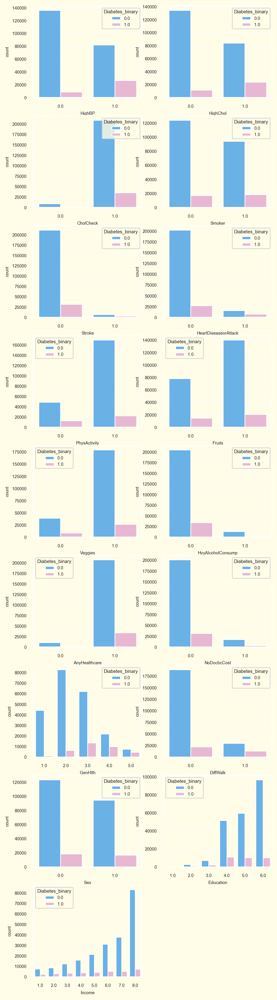

In [51]:
sns.set_theme(rc = {'figure.dpi': 220, 'axes.labelsize': 6, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)
fig, ax = plt.subplots(9, 2, figsize = (6, 25))
for indx, (column, axes) in list(enumerate(list(zip(categorical_cols, ax.flatten())))):
    if column not in 'Diabetes_binary':
        sns.countplot(ax = axes, x = df[column], hue = df['Diabetes_binary'], palette = {'#f0b0d2','#56b4fa'}, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   
axes_legend = ax.flatten()
axes_legend[1].legend(title = 'Diabetes_binary', loc = 'upper right')
axes_legend[2].legend(title = 'Diabetes_binary', loc = 'upper right')
plt.show()

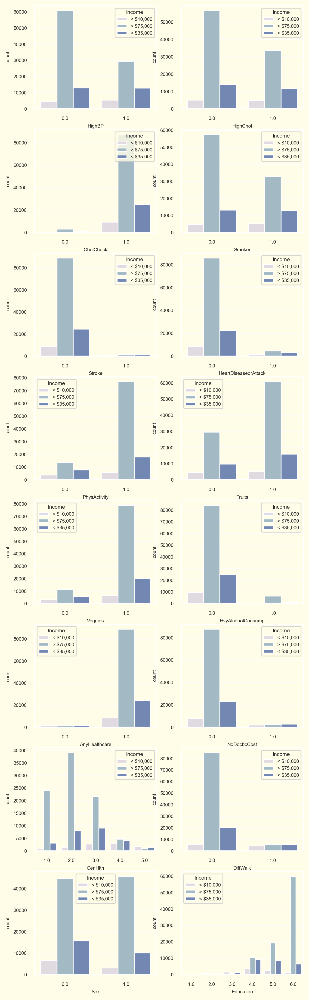

In [52]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 6, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.55)
fig, ax = plt.subplots(9, 2, figsize = (6, 25))
cat2 = []
for i in categorical_cols:
    if i not in 'Income':
        cat2.append(i)
for indx, (column, axes) in list(enumerate(list(zip(cat2, ax.flatten())))):
    sns.countplot(ax = axes, x = df[column], hue = df['Income'].map({1:'< $10,000',5:'< $35,000',8:'> $75,000'})
    , palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   
axes_legend = ax.flatten()
axes_legend[1].legend(title = 'Income', loc = 'upper right')
axes_legend[2].legend(title = 'Income', loc = 'upper right')
plt.show()

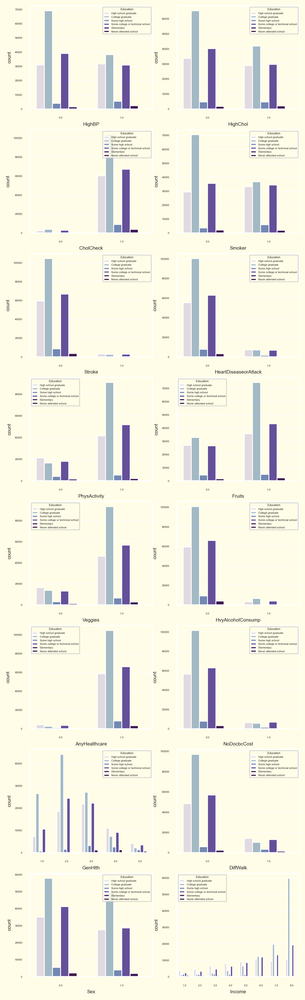

In [53]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 6, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.3)
fig, ax = plt.subplots(9, 2, figsize = (6, 25))
cat2 = []
for i in categorical_cols:
    if i not in 'Education':
        cat2.append(i)
for indx, (column, axes) in list(enumerate(list(zip(cat2, ax.flatten())))):
    sns.countplot(ax = axes, x = df[column], hue = df['Education'].map(edu), palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   
axes_legend = ax.flatten()
axes_legend[1].legend(title = 'Education', loc = 'upper right')
axes_legend[2].legend(title = 'Education', loc = 'upper right')
plt.show()

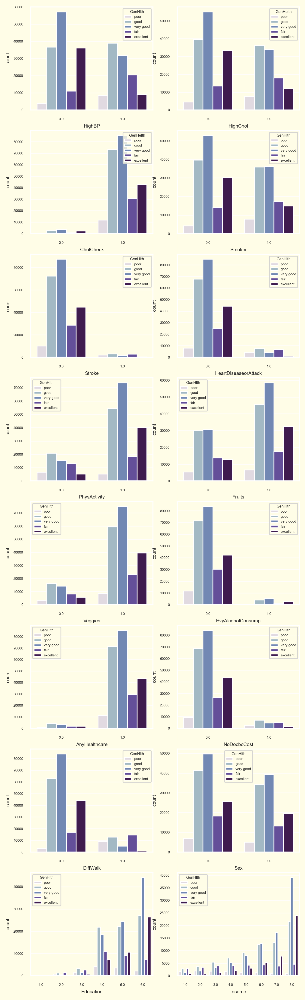

In [54]:
sns.set_theme(rc = {'figure.dpi': 250, 'axes.labelsize': 6, 
                    'axes.facecolor': '#FFFDE7', 'grid.color': '#fffdfa', 
                    'figure.facecolor': '#FFFDE7'}, font_scale = 0.4)
fig, ax = plt.subplots(9, 2, figsize = (6, 25))
cat2 = []
for i in categorical_cols:
    if i not in 'GenHlth':
        cat2.append(i)
for indx, (column, axes) in list(enumerate(list(zip(cat2, ax.flatten())))):
    sns.countplot(ax = axes, x = df[column], 
    hue = df['GenHlth'].map({1:'excellent',2:'very good',3:'good',4:'fair',5:'poor'}), palette = colors, alpha = 1)  
else:
    [axes.set_visible(False) for axes in ax.flatten()[indx + 1:]]   
axes_legend = ax.flatten()
axes_legend[1].legend(title = 'GenHelth', loc = 'upper right')
axes_legend[2].legend(title = 'GenHelth', loc = 'upper right')
plt.show()

In [55]:
numerical_cols

['BMI', 'MentHlth', 'PhysHlth']

In [56]:
px.histogram(df, x=df['BMI'], title='BMI vs. Diabetes', color='Diabetes_binary')

In [57]:
px.histogram(df, x=df['MentHlth'], title='MentHlth vs. Diabetes', color='Diabetes_binary')

In [58]:
px.histogram(df, x=df['PhysHlth'], title='PhysHlth vs. Diabetes', color='Diabetes_binary')

### Plot a Shifted Correlation Matrix

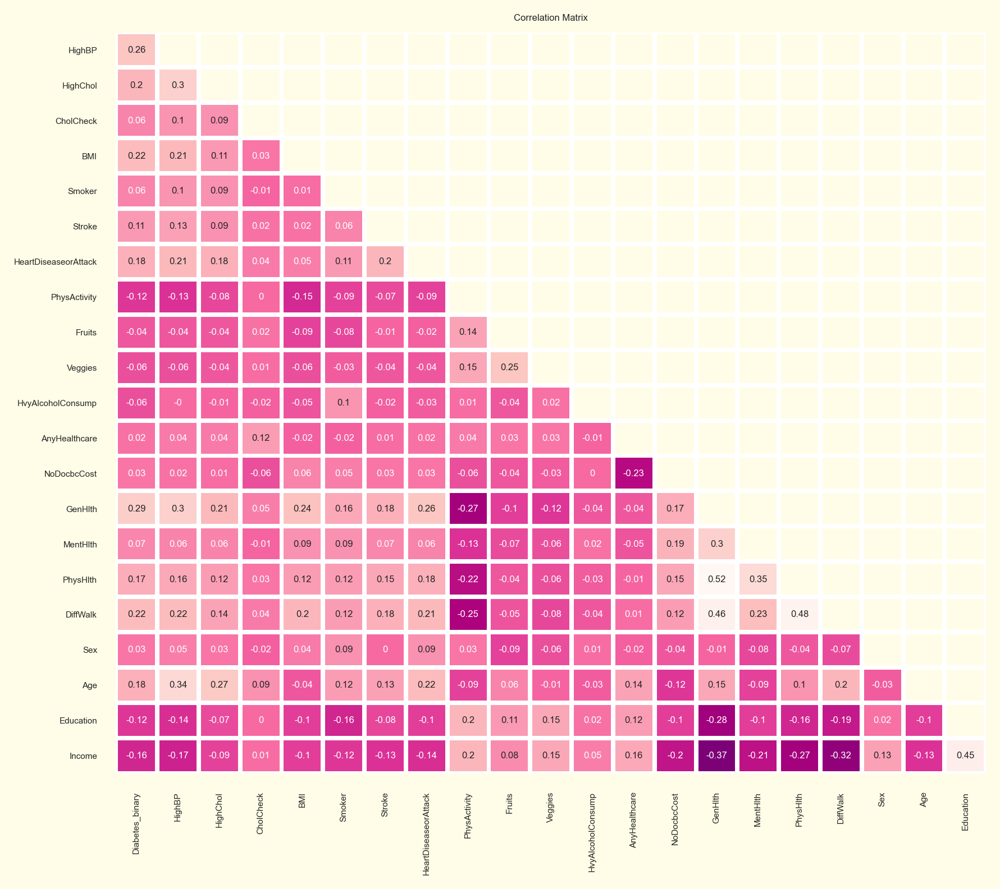

In [59]:
def corrMat(df):
    
    corr_mat = df.corr().round(2)
    f, ax = plt.subplots(figsize=(8,7))
    mask = np.triu(np.ones_like(corr_mat, dtype=bool))
    mask = mask[1:,:-1]
    corr = corr_mat.iloc[1:,:-1].copy()
    sns.heatmap(corr,mask=mask,vmin=-0.5,vmax=0.5,center=0, 
                cmap='RdPu_r',square=False,lw=2,annot=True,cbar=False)
    ax.set_title('Correlation Matrix')
    
corrMat(df)

In [60]:
df.shape

(253680, 22)

### Calculate Num. of Outliers

In [61]:
def count_outliers(data,col):
    
    q1 = data[col].quantile(0.25,interpolation='nearest')
    q2 = data[col].quantile(0.5,interpolation='nearest')
    q3 = data[col].quantile(0.75,interpolation='nearest')
    q4 = data[col].quantile(1,interpolation='nearest')

    IQR = q3 -q1
    Lower_Bound = q1 - 1.5*IQR
    Upper_Bound = q3 + 1.5*IQR

    if data[col].min() > Lower_Bound and data[col].max() < Upper_Bound:
        print("No outliers in",i)
    else:
        print("There are outliers in",i)
        x = data[data[col]<Lower_Bound][col].size
        y = data[data[col]>Upper_Bound][col].size
        a.append(i)
        print('Count of outliers are:',x+y)

a = []
for i in numerical_cols:
    count_outliers(df,i)

There are outliers in BMI
Count of outliers are: 9847
There are outliers in MentHlth
Count of outliers are: 36208
There are outliers in PhysHlth
Count of outliers are: 40949


## Scaling Data

In [62]:
x = df.drop(['Diabetes_binary'],axis=1)
y = df['Diabetes_binary']

In [63]:
scaler = StandardScaler()
scaler.fit(x)

StandardScaler()

In [64]:
scaled_features = scaler.transform(x)
x = pd.DataFrame(scaled_features,columns=df.columns[1:])
x.head()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1.153688,1.165254,0.196922,1.757936,1.120927,-0.205637,-0.322458,-1.762814,-1.316872,0.482087,...,0.226863,-0.303173,2.329121,1.998592,1.233999,2.223615,-0.887021,0.316900,-1.065595,-1.474487
1,-0.866785,-0.858182,-5.078164,-0.511806,1.120927,-0.205637,-0.322458,0.567275,-1.316872,-2.074316,...,-4.407954,3.298445,0.457294,-0.429630,-0.486592,-0.449718,-0.887021,-0.337933,0.963272,-2.440138
2,1.153688,1.165254,0.196922,-0.057858,-0.892119,-0.205637,-0.322458,-1.762814,0.759375,-2.074316,...,0.226863,3.298445,2.329121,3.617407,2.954590,2.223615,-0.887021,0.316900,-1.065595,0.939638
3,1.153688,-0.858182,0.196922,-0.209174,-0.892119,-0.205637,-0.322458,0.567275,0.759375,0.482087,...,0.226863,-0.303173,-0.478619,-0.429630,-0.486592,-0.449718,-0.887021,0.971733,-2.080028,-0.026012
4,1.153688,1.165254,0.196922,-0.663122,-0.892119,-0.205637,-0.322458,0.567275,0.759375,0.482087,...,0.226863,-0.303173,-0.478619,-0.024926,-0.486592,-0.449718,-0.887021,0.971733,-0.051162,-0.991662


## Training and Testing Data

In [65]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [66]:
knn = KNeighborsClassifier(n_neighbors = 5)
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [67]:
y_pred = knn.predict(x_test)

In [68]:
y_pred

array([0., 0., 0., ..., 0., 0., 0.])

In [69]:
df['Diabetes_binary'].value_counts()

0.0    218334
1.0     35346
Name: Diabetes_binary, dtype: int64

In [70]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.88      0.95      0.91     65605
         1.0       0.39      0.21      0.27     10499

    accuracy                           0.85     76104
   macro avg       0.64      0.58      0.59     76104
weighted avg       0.81      0.85      0.83     76104



In [71]:
print(confusion_matrix(y_test,y_pred))

[[62268  3337]
 [ 8323  2176]]


### Due to imbalanced data the accuracy predition about diabates are low so we will fix it with **SMOTE + ENN**<br><br>
### `SMOTE` --> `Synthetic Minority Oversampling Technique`
### **SMOTE + ENN** is technique where more no. of observations are removed from the sample space. ENN is undersampling technique where the nearest neighbors of each of the majority class is estimated. If the nearest neighbors misclassify that particular instance of the majority class, then that instance gets deleted.<br><br>
### Integrating this technique with oversampled data done by **SMOTE** helps in doing extensive data cleaning. Here on misclassification by NN’s samples from both the classes are removed. This results in a more clear and concise class separation.

In [72]:
sm = SMOTEENN()
x_resampled, y_resampled = sm.fit_resample(x,y)

In [73]:
xre_train,xre_test,yre_train,yre_test = train_test_split(x_resampled, y_resampled, test_size=0.3, random_state=42)

In [74]:
knn_smote = KNeighborsClassifier(n_neighbors = 5)
knn_smote.fit(xre_train,yre_train)

KNeighborsClassifier()

In [77]:
yre_pred = knn_smote.predict(xre_test)

In [78]:
print(classification_report(yre_test,yre_pred, labels=[0,1]))

              precision    recall  f1-score   support

           0       0.98      0.90      0.94     43519
           1       0.93      0.99      0.96     57914

    accuracy                           0.95    101433
   macro avg       0.95      0.94      0.95    101433
weighted avg       0.95      0.95      0.95    101433



Now we see that there are huge differenece before and after **resampling data**

In [79]:
print("Accuracy:",metrics.accuracy_score(yre_test,yre_pred))

Accuracy: 0.9475022921534412


In [80]:
# error_rate= []
# for i in range(1,40):
#     knn_smote = KNeighborsClassifier(n_neighbors = i)
#     knn_smote.fit(xre_train,yre_train)
#     yre_pred_i = knn_smote.predict(xre_test)
#     error_rate.append(np.mean(yre_pred_i != yre_test))

In [81]:
# plt.figure(figsize = (10,6))
# plt.plot(range(1,40),error_rate,color = 'blue',linestyle = '--',marker = 'o',markerfacecolor='red',markersize = 10)
# plt.title('Error Rate vs. n_neighbors')
# plt.xlabel('n_neighbors')
# plt.ylabel('Error Rate')

## Random Forest Technique

In [82]:
model_rf = RandomForestClassifier(n_jobs=-1, random_state=42,n_estimators=150)

In [83]:
model_rf.fit(xre_train,yre_train)

RandomForestClassifier(n_estimators=150, n_jobs=-1, random_state=42)

In [84]:
yrf_pred = model_rf.predict(xre_test)
yrf_pred

array([1., 1., 0., ..., 1., 1., 1.])

In [85]:
print(classification_report(yre_test,yrf_pred, labels=[0,1]))

              precision    recall  f1-score   support

           0       0.95      0.94      0.95     43519
           1       0.96      0.96      0.96     57914

    accuracy                           0.96    101433
   macro avg       0.96      0.95      0.95    101433
weighted avg       0.96      0.96      0.96    101433



In [86]:
importance_rf = pd.DataFrame({
    'feature': xre_train.columns,
    'score': model_rf.feature_importances_
}).sort_values('score', ascending=False)

importance_rf.head(10)

,feature,score
13,GenHlth,0.208159
3,BMI,0.150385
0,HighBP,0.135423
18,Age,0.130406
20,Income,0.077540
1,HighChol,0.055724
15,PhysHlth,0.050243
19,Education,0.038850
16,DiffWalk,0.026858
14,MentHlth,0.025563


[Text(0.5, 0, 'Score'), Text(0, 0.5, 'Feature')]

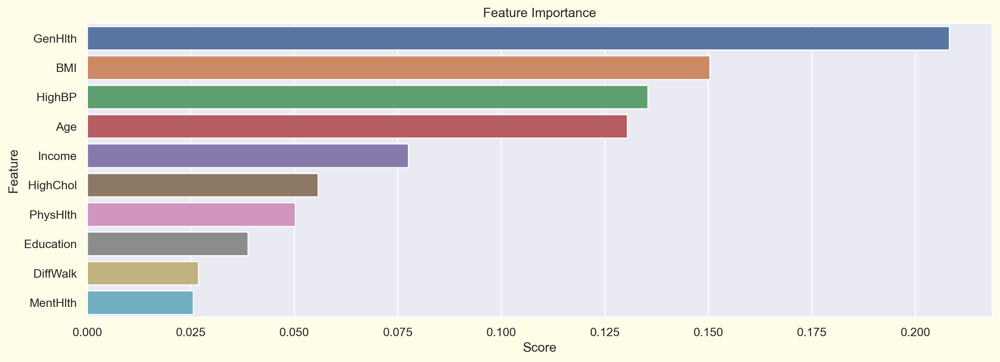

In [87]:
# Income, Education, PhysActivity --> Negative correlation
# GenHlth, HighBP, DiffWalk,BMI --> Positive correlation
plt.figure(figsize = (15,5))
sns.set(font_scale = 1)
plt.title('Feature Importance')
ax = sns.barplot(data=importance_rf.head(10), x='score', y='feature')
ax.set(xlabel='Score', ylabel='Feature')